# LL3 (abs logFC based) 25D2

In [1]:
library (tidyverse)
library (openxlsx)
library(magrittr)  
library(ggrepel)
library (cowplot)
library (reshape2)
library (readr)
library (ggpubr)
library (drc)
library(broom)
library(modelr)
library(purrr)

── Attaching packages ──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.7
✔ tidyr   1.1.4     ✔ stringr 1.4.0
✔ readr   2.1.1     ✔ forcats 0.5.1

── Conflicts ─────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘magrittr’


The following object is masked from ‘package:purrr’:

    set_names


The following object is masked from ‘package:tidyr’:

    extract



Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths



Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend


Loading requi

In [2]:
fig <- function(width, heigth){
options(repr.plot.width = width, repr.plot.height = heigth) }

In [3]:
long = read.table("./data/f_CA2021_inlog_FC15_FC2_evidence-threshold_final.tsv", sep = '\t', row.names =1, header = T)

In [4]:
d = long %>%
filter (., ref_206 == "yes")
dim (d)

[1] 206 150

In [5]:
str(d, list.len=ncol(d))

'data.frame':	206 obs. of  150 variables:
 $ EtOH_x_04h_R1          : num  3.863 11.708 0.169 3.332 5.89 ...
 $ EtOH_x_04h_R2          : num  3.447 11.653 0.189 3.894 5.829 ...
 $ EtOH_x_04h_R3          : num  3.794 11.724 -0.191 3.652 5.732 ...
 $ EtOH_x_08h_R1          : num  5.17 11.82 1.74 3.02 5.5 ...
 $ EtOH_x_08h_R2          : num  5.32 11.81 2.3 2.92 5.33 ...
 $ EtOH_x_08h_R3          : num  5.72 11.78 1.96 2.84 4.83 ...
 $ EtOH_x_24h_R1          : num  6.77 12.9 2.26 4.96 5.56 ...
 $ EtOH_x_24h_R2          : num  6.61 12.62 3.04 4.42 5.26 ...
 $ EtOH_x_24h_R3          : num  7.19 12.47 2.74 4.6 4.38 ...
 $ V125D3_0.1nM_24h_R1    : num  6.29 12.37 2.72 4.58 4.8 ...
 $ V125D3_0.1nM_24h_R2    : num  6.57 12.11 3.02 4.38 4.53 ...
 $ V125D3_0.1nM_24h_R3    : num  6.48 12.31 3.2 4.38 4.59 ...
 $ V125D3_10nM_04h_R1     : num  3.166 11.387 0.208 3.374 5.127 ...
 $ V125D3_10nM_04h_R2     : num  3.255 11.405 0.879 3.691 5.543 ...
 $ V125D3_10nM_04h_R3     : num  3.387 11.52 -0.191 3.326

In [6]:
d$abs_logFC_V25D2_100nM_24h = abs(d$logFC_V25D2_100nM_24h)
d$abs_logFC_V25D2_250nM_24h = abs(d$logFC_V25D2_250nM_24h)
d$abs_logFC_V25D2_500nM_24h = abs(d$logFC_V25D2_500nM_24h)
d$abs_logFC_V25D2_750nM_24h = abs(d$logFC_V25D2_750nM_24h)
d$abs_logFC_V25D2_1000nM_24h = abs(d$logFC_V25D2_1000nM_24h)

MEAN

In [7]:
davg = d %>%
dplyr::select (., abs_logFC_V25D2_100nM_24h:abs_logFC_V25D2_1000nM_24h)

In [8]:
davg = davg %>% #eighthours
  mutate (abs_logFC_V25D2_0_24h = rep(0,nrow(.)))

In [9]:
head (davg)

,abs_logFC_V25D2_100nM_24h,abs_logFC_V25D2_250nM_24h,abs_logFC_V25D2_500nM_24h,abs_logFC_V25D2_750nM_24h,abs_logFC_V25D2_1000nM_24h,abs_logFC_V25D2_0_24h
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,0.2183911,0.1467958,1.424840,1.315080,1.834794,0
ACTB,0.1822865,0.5062614,1.347324,1.455576,1.541519,0
ACVRL1,0.8787046,0.9713228,2.213510,2.109090,1.791887,0
ADAMTSL4,0.2484163,0.7451152,1.960843,2.499667,2.613400,0
ADGRE1,0.1653137,0.9471341,2.652363,2.500055,2.985780,0
ADGRE3,0.1243572,1.4862416,2.602792,3.282920,3.243971,0


In [10]:
dt = davg

In [11]:
newfishes = rownames (dt)
head(newfishes)

[1] "ABCC3"    "ACTB"     "ACVRL1"   "ADAMTSL4" "ADGRE1"   "ADGRE3"

In [12]:
df2_Ind = as.vector (colnames (dt))

df_y = colsplit(df2_Ind, "_", c("placeholder","placeholder2","treatment", "concentration", "time"))
df_y = as.data.frame(unclass(df_y))

df_y$sample <- df2_Ind
#df_ya

df_y = df_y %>%
  mutate(., conc = concentration)

df_y$conc <- gsub("nM","",as.character(df_y$conc))
df_y$conc = as.numeric (df_y$conc)

df_y

placeholder,placeholder2,treatment,concentration,time,sample,conc
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
abs,logFC,V25D2,100nM,24h,abs_logFC_V25D2_100nM_24h,100
abs,logFC,V25D2,250nM,24h,abs_logFC_V25D2_250nM_24h,250
abs,logFC,V25D2,500nM,24h,abs_logFC_V25D2_500nM_24h,500
abs,logFC,V25D2,750nM,24h,abs_logFC_V25D2_750nM_24h,750
abs,logFC,V25D2,1000nM,24h,abs_logFC_V25D2_1000nM_24h,1000
abs,logFC,V25D2,0,24h,abs_logFC_V25D2_0_24h,0


In [13]:
small_pwt_T = as.data.frame (t(dt))
small_pwt_T

small_pwt_T = small_pwt_T %>%
  rownames_to_column ("sample")

mrg = merge(x=small_pwt_T,y=df_y,by.x="sample", all.x =T)
(head)

head(mrg)

,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,AQP9,⋯,TMEM176A,TMEM176B,TNFRSF21,TNFRSF4,TREM1,TRIM36,TRPM2,TXLNB,VSIG4,ZBTB46
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
abs_logFC_V25D2_100nM_24h,0.2183911,0.1822865,0.8787046,0.2484163,0.1653137,0.1243572,0.9210516,0.5596223,0.5819306,0.620766,⋯,0.2630689,0.03771819,0.9580154,1.220093,1.385754,0.001364046,0.02583785,0.3922178,1.0495568,0.1800978
abs_logFC_V25D2_250nM_24h,0.1467958,0.5062614,0.9713228,0.7451152,0.9471341,1.4862416,1.6811117,0.9632833,0.7692392,1.251460,⋯,0.5104029,0.50752579,1.1889017,1.669739,1.906494,0.679241147,0.68233844,0.6028925,0.7693025,1.0140730
abs_logFC_V25D2_500nM_24h,1.4248395,1.3473236,2.2135103,1.9608434,2.6523627,2.6027922,2.6299721,1.9684276,1.6768209,2.086292,⋯,2.8983921,2.81259657,2.7478017,2.186551,3.094827,2.598413104,2.76291802,3.3851604,2.0350828,3.4305087
abs_logFC_V25D2_750nM_24h,1.3150804,1.4555758,2.1090903,2.4996674,2.5000555,3.2829202,2.3953984,1.5698064,1.7825434,2.188490,⋯,3.2269836,2.94478597,2.9649363,2.510694,3.101222,2.679933236,3.34876718,3.8858121,1.9882460,2.7028176
abs_logFC_V25D2_1000nM_24h,1.8347939,1.5415186,1.7918873,2.6134004,2.9857803,3.2439706,2.0618194,2.1841597,1.4104242,1.985520,⋯,3.7584035,3.28805600,2.5281155,2.542441,2.861687,3.149731545,3.58621474,3.7372719,1.9363027,3.5818463
abs_logFC_V25D2_0_24h,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.00000000,0.0000000,0.000000,0.000000,0.000000000,0.00000000,0.0000000,0.0000000,0.0000000


function (x, ...) 
UseMethod("head")
<bytecode: 0x5586f6951420>
<environment: namespace:utils>

,sample,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,⋯,TRPM2,TXLNB,VSIG4,ZBTB46,placeholder,placeholder2,treatment,concentration,time,conc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,abs_logFC_V25D2_0_24h,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.00000000,0.0000000,0.0000000,0.0000000,abs,logFC,V25D2,0,24h,0
2,abs_logFC_V25D2_1000nM_24h,1.8347939,1.5415186,1.7918873,2.6134004,2.9857803,3.2439706,2.0618194,2.1841597,1.4104242,⋯,3.58621474,3.7372719,1.9363027,3.5818463,abs,logFC,V25D2,1000nM,24h,1000
3,abs_logFC_V25D2_100nM_24h,0.2183911,0.1822865,0.8787046,0.2484163,0.1653137,0.1243572,0.9210516,0.5596223,0.5819306,⋯,0.02583785,0.3922178,1.0495568,0.1800978,abs,logFC,V25D2,100nM,24h,100
4,abs_logFC_V25D2_250nM_24h,0.1467958,0.5062614,0.9713228,0.7451152,0.9471341,1.4862416,1.6811117,0.9632833,0.7692392,⋯,0.68233844,0.6028925,0.7693025,1.0140730,abs,logFC,V25D2,250nM,24h,250
5,abs_logFC_V25D2_500nM_24h,1.4248395,1.3473236,2.2135103,1.9608434,2.6523627,2.6027922,2.6299721,1.9684276,1.6768209,⋯,2.76291802,3.3851604,2.0350828,3.4305087,abs,logFC,V25D2,500nM,24h,500
6,abs_logFC_V25D2_750nM_24h,1.3150804,1.4555758,2.1090903,2.4996674,2.5000555,3.2829202,2.3953984,1.5698064,1.7825434,⋯,3.34876718,3.8858121,1.9882460,2.7028176,abs,logFC,V25D2,750nM,24h,750


In [14]:
# create a vector with letters in the desired order
roworder <- c("abs_logFC_V25D2_0_24h", "abs_logFC_V25D2_100nM_24h", "abs_logFC_V25D2_250nM_24h", "abs_logFC_V25D2_500nM_24h", "abs_logFC_V25D2_750nM_24h",  "abs_logFC_V25D2_1000nM_24h")

mrg = mrg %>%
  slice(match(roworder, sample))

In [15]:
head (mrg)

,sample,ABCC3,ACTB,ACVRL1,ADAMTSL4,ADGRE1,ADGRE3,ADGRG3,AGRN,ALOX5,⋯,TRPM2,TXLNB,VSIG4,ZBTB46,placeholder,placeholder2,treatment,concentration,time,conc
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>
1,abs_logFC_V25D2_0_24h,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,⋯,0.00000000,0.0000000,0.0000000,0.0000000,abs,logFC,V25D2,0,24h,0
2,abs_logFC_V25D2_100nM_24h,0.2183911,0.1822865,0.8787046,0.2484163,0.1653137,0.1243572,0.9210516,0.5596223,0.5819306,⋯,0.02583785,0.3922178,1.0495568,0.1800978,abs,logFC,V25D2,100nM,24h,100
3,abs_logFC_V25D2_250nM_24h,0.1467958,0.5062614,0.9713228,0.7451152,0.9471341,1.4862416,1.6811117,0.9632833,0.7692392,⋯,0.68233844,0.6028925,0.7693025,1.0140730,abs,logFC,V25D2,250nM,24h,250
4,abs_logFC_V25D2_500nM_24h,1.4248395,1.3473236,2.2135103,1.9608434,2.6523627,2.6027922,2.6299721,1.9684276,1.6768209,⋯,2.76291802,3.3851604,2.0350828,3.4305087,abs,logFC,V25D2,500nM,24h,500
5,abs_logFC_V25D2_750nM_24h,1.3150804,1.4555758,2.1090903,2.4996674,2.5000555,3.2829202,2.3953984,1.5698064,1.7825434,⋯,3.34876718,3.8858121,1.9882460,2.7028176,abs,logFC,V25D2,750nM,24h,750
6,abs_logFC_V25D2_1000nM_24h,1.8347939,1.5415186,1.7918873,2.6134004,2.9857803,3.2439706,2.0618194,2.1841597,1.4104242,⋯,3.58621474,3.7372719,1.9363027,3.5818463,abs,logFC,V25D2,1000nM,24h,1000


In [16]:
mrg2 = mrg %>% 
  pivot_longer(all_of(newfishes)) %>%  #eighthours
  arrange (name)

mrg2$name <- as.factor(mrg2$name)
head (mrg2)

mrg2 = mrg2 %>%
  dplyr::group_by(name)
head (mrg2)

sample,placeholder,placeholder2,treatment,concentration,time,conc,name,value
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>
abs_logFC_V25D2_0_24h,abs,logFC,V25D2,0,24h,0,ABCC3,0.0000000
abs_logFC_V25D2_100nM_24h,abs,logFC,V25D2,100nM,24h,100,ABCC3,0.2183911
abs_logFC_V25D2_250nM_24h,abs,logFC,V25D2,250nM,24h,250,ABCC3,0.1467958
abs_logFC_V25D2_500nM_24h,abs,logFC,V25D2,500nM,24h,500,ABCC3,1.4248395
abs_logFC_V25D2_750nM_24h,abs,logFC,V25D2,750nM,24h,750,ABCC3,1.3150804
abs_logFC_V25D2_1000nM_24h,abs,logFC,V25D2,1000nM,24h,1000,ABCC3,1.8347939


sample,placeholder,placeholder2,treatment,concentration,time,conc,name,value
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>
abs_logFC_V25D2_0_24h,abs,logFC,V25D2,0,24h,0,ABCC3,0.0000000
abs_logFC_V25D2_100nM_24h,abs,logFC,V25D2,100nM,24h,100,ABCC3,0.2183911
abs_logFC_V25D2_250nM_24h,abs,logFC,V25D2,250nM,24h,250,ABCC3,0.1467958
abs_logFC_V25D2_500nM_24h,abs,logFC,V25D2,500nM,24h,500,ABCC3,1.4248395
abs_logFC_V25D2_750nM_24h,abs,logFC,V25D2,750nM,24h,750,ABCC3,1.3150804
abs_logFC_V25D2_1000nM_24h,abs,logFC,V25D2,1000nM,24h,1000,ABCC3,1.8347939


In [17]:
#save(mrg2,
#     file = "data/mrg2table_abs25D3.RData")

In [18]:
#load(file = "data/mrg2table_abs25D3.RData")

In [19]:
mrg3= mrg2 %>%
dplyr::select (., c("conc", "name", "value")) 

head(mrg3)

conc,name,value
<dbl>,<fct>,<dbl>
0,ABCC3,0.0000000
100,ABCC3,0.2183911
250,ABCC3,0.1467958
500,ABCC3,1.4248395
750,ABCC3,1.3150804
1000,ABCC3,1.8347939


ec_50:(Intercept) 
          295.432

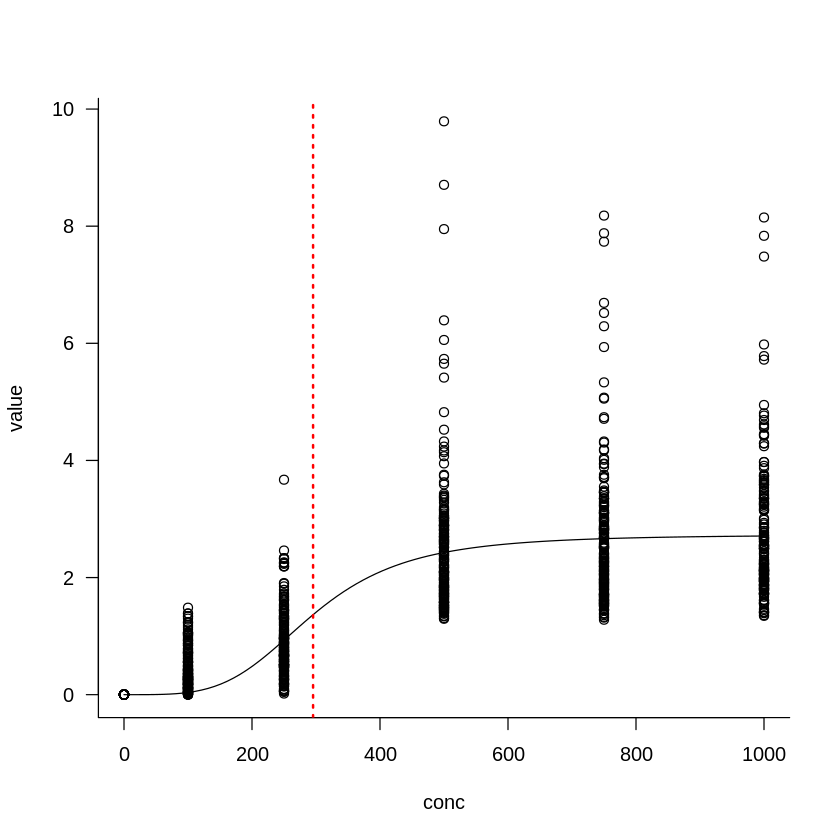

In [20]:
hydroxytestLL.3 <- drm(value ~ conc,
                 #  curveid = name, 
                   data = mrg2,

  fct = LL.3(
 #     fixed=c(NA, max(mrg2$value), NA), #max(mrg2$value)
      names = c('hill', 'max_value', 'ec_50')))
#))

ec50 <- hydroxytestLL.3$coefficients['ec_50:(Intercept)']
ec50

plot(hydroxytestLL.3, bty="l", type = "all", broken=TRUE, log = "")#log = ""
abline(v = ec50, col="red", lwd=2, lty=3)
#abline(h = 0.5, col="red", lwd=2, lty=3)

In [21]:
summary (hydroxytestLL.3)


Model fitted: Log-logistic (ED50 as parameter) with lower limit at 0 (3 parms)

Parameter estimates:

                        Estimate Std. Error t-value   p-value    
hill:(Intercept)       -3.948936   0.621336 -6.3556 2.917e-10 ***
max_value:(Intercept)   2.731119   0.064436 42.3851 < 2.2e-16 ***
ec_50:(Intercept)     295.431981   8.744052 33.7866 < 2.2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error:

 0.8725155 (1233 degrees of freedom)

In [22]:
round (295.431981)
round (8.744052)

[1] 295

[1] 9

In [23]:
#test

test_LL.3 = drm(value ~ conc,  
    data = mrg3,  
    fct= LL.3(names = c('hill', 'max_value', 'ec_50')))

In [24]:
head (test_LL.3)

9.87960694,-72.837206,-0.01130629
-72.83720593,1170.720403,-2.94802265
-0.01130629,-2.948023,0.03442686


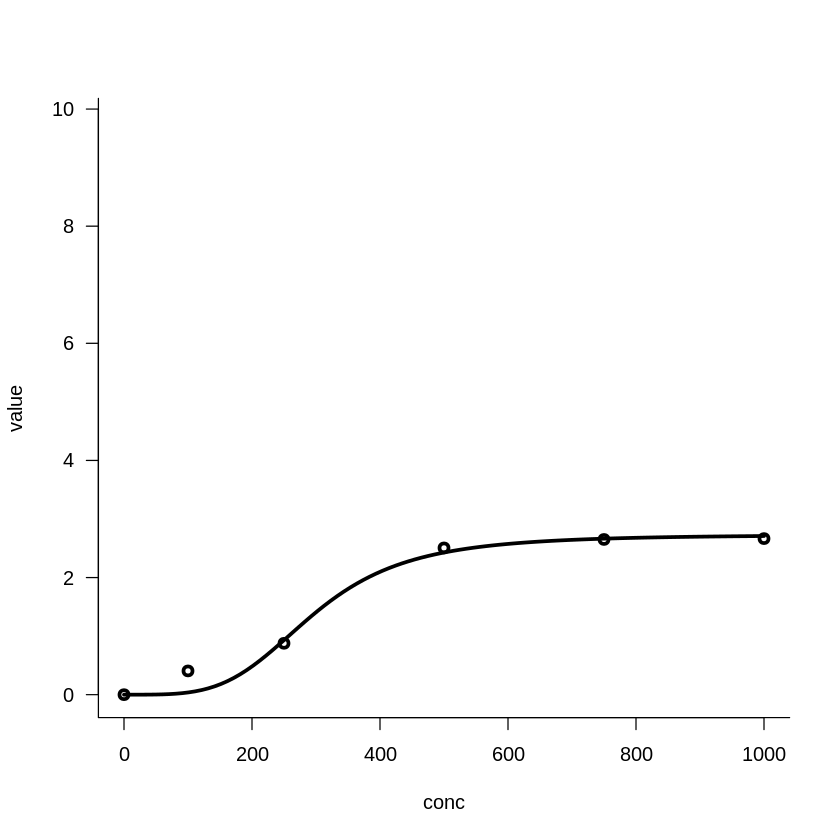

In [25]:
plot (test_LL.3,
            bty="l",  
       broken=TRUE, 
       lwd=3,
           log = "",)

In [26]:
mrg4= mrg3 %>%
#dplyr::select (., c("conc", "name", "value")) %>% 
summarise(real_maxval = max(value))

In [27]:
d = mrg3  %>% 
nest(-name)

head(d)

Warning message:
“All elements of `...` must be named.
Did you want `data = c(conc, value)`?”


name,data
<fct>,<list>
ABCC3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.2183911, 0.1467958, 1.4248395, 1.3150804, 1.8347939"
ACTB,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1822865, 0.5062614, 1.3473236, 1.4555758, 1.5415186"
ACVRL1,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.8787046, 0.9713228, 2.2135103, 2.1090903, 1.7918873"
ADAMTSL4,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.2484163, 0.7451152, 1.9608434, 2.4996674, 2.6134004"
ADGRE1,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1653137, 0.9471341, 2.6523627, 2.5000555, 2.9857803"
ADGRE3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1243572, 1.4862416, 2.6027922, 3.2829202, 3.2439706"


In [28]:
d = d %>%
mutate (real_maxval = map_dbl(data, ~{max(.x$value)}))
#tidy

head (d)

name,data,real_maxval
<fct>,<list>,<dbl>
ABCC3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.2183911, 0.1467958, 1.4248395, 1.3150804, 1.8347939",1.834794
ACTB,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1822865, 0.5062614, 1.3473236, 1.4555758, 1.5415186",1.541519
ACVRL1,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.8787046, 0.9713228, 2.2135103, 2.1090903, 1.7918873",2.213510
ADAMTSL4,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.2484163, 0.7451152, 1.9608434, 2.4996674, 2.6134004",2.613400
ADGRE1,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1653137, 0.9471341, 2.6523627, 2.5000555, 2.9857803",2.985780
ADGRE3,"0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1243572, 1.4862416, 2.6027922, 3.2829202, 3.2439706",3.282920


In [29]:
d$data[d$name == "ABCC3"]

conc,value
<dbl>,<dbl>
0,0.0000000
100,0.2183911
250,0.1467958
500,1.4248395
750,1.3150804
1000,1.8347939


In [30]:
gene_model_LL.3 <- function(df){
drm(value ~ conc, 
    data = df, 
    fct= LL.3(names = c('hill', 'max_value', 'ec_50')))
}

In [31]:
#Fitting models to nested data

d = d %>%
mutate (fit = map(data, gene_model_LL.3)) #%>%
#tidy

head (d, n =2)

name 
1 ABCC3
2 ACTB 
  data                                                                                                                                         
1 0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.2183911, 0.1467958, 1.4248395, 1.3150804, 1.8347939
2 0.0000000, 100.0000000, 250.0000000, 500.0000000, 750.0000000, 1000.0000000, 0.0000000, 0.1822865, 0.5062614, 1.3473236, 1.4555758, 1.5415186
  real_maxval
1 1.834794   
2 1.541519   
  fit                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

In [32]:
d$fit[d$name == "ABCC3"]

[[1]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -5.648                  1.612                365.061  



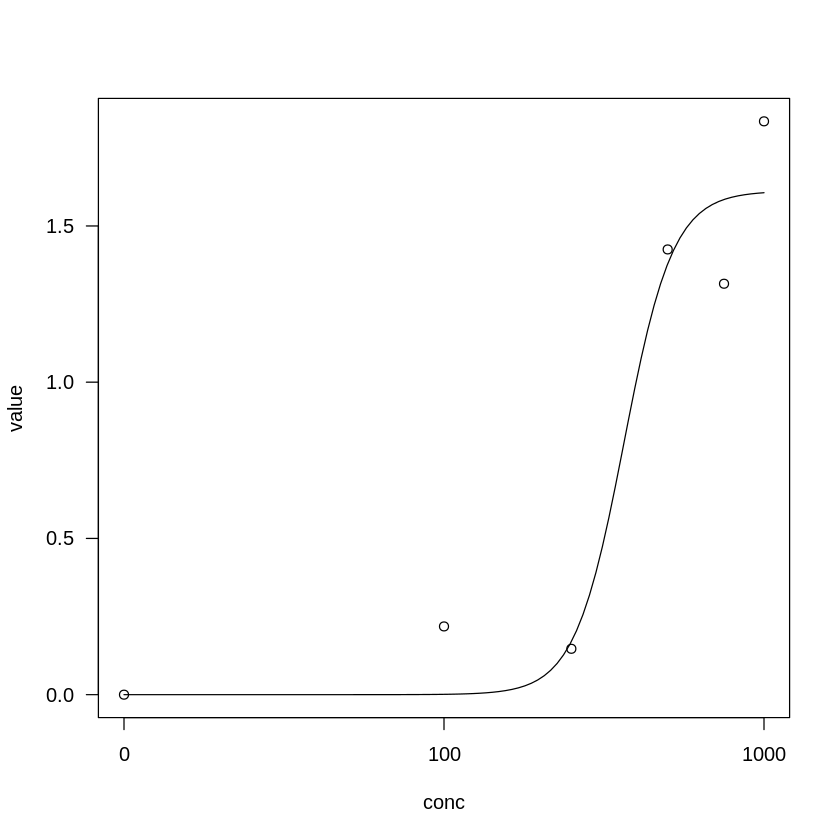

In [33]:
plot(d$fit[[1]])

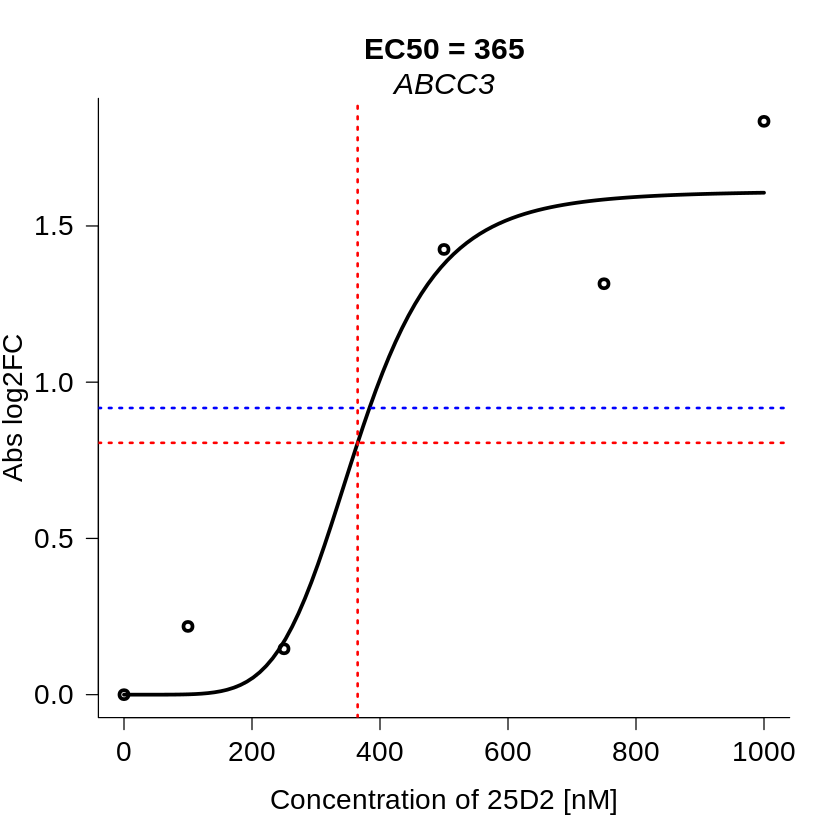

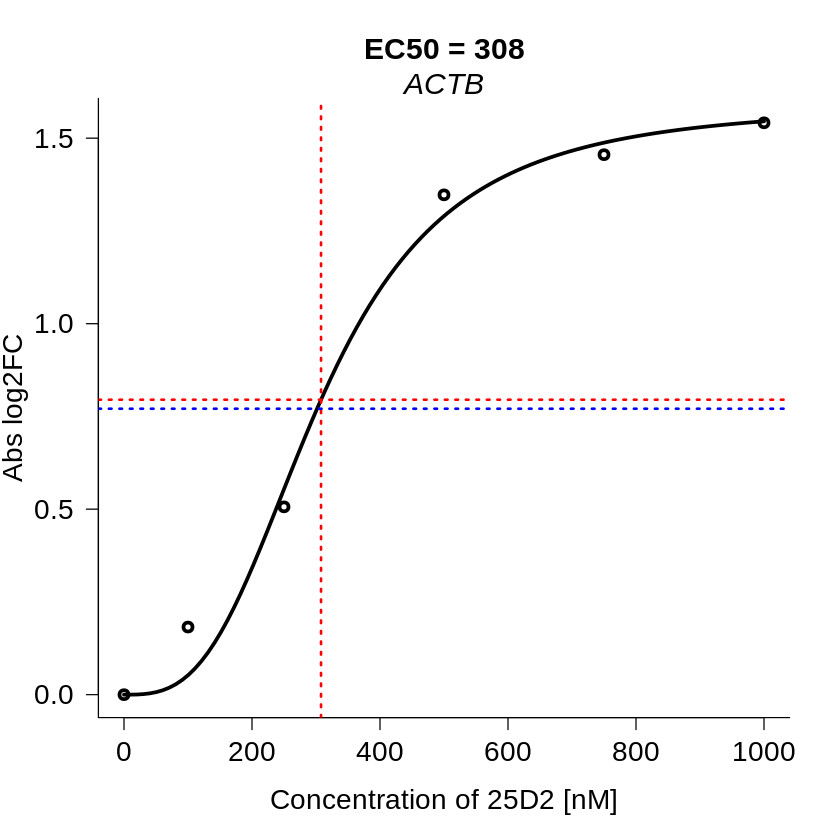

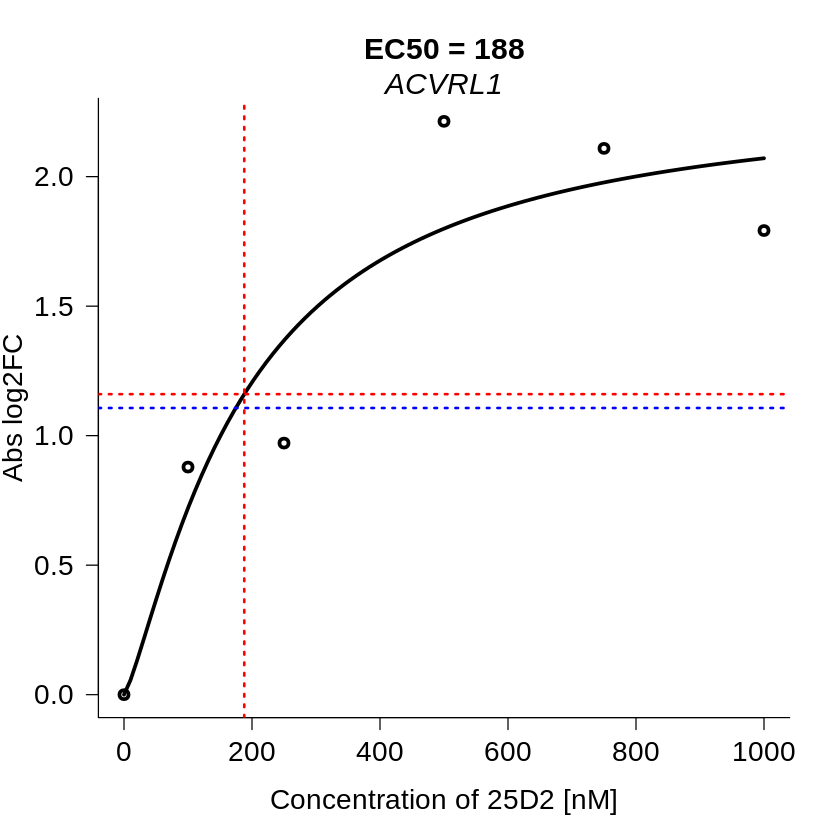

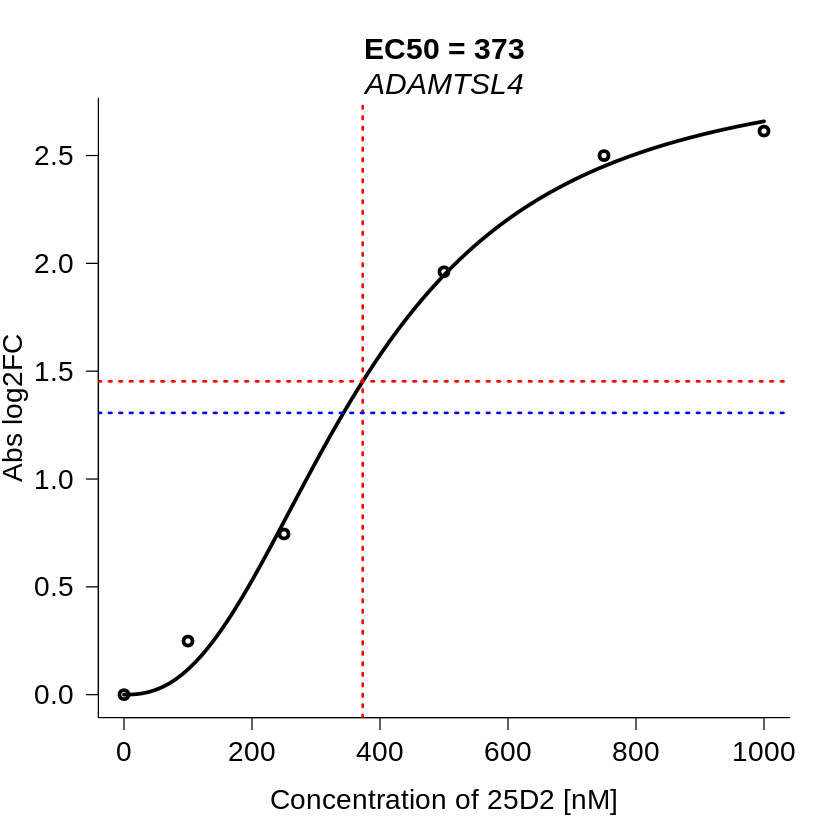

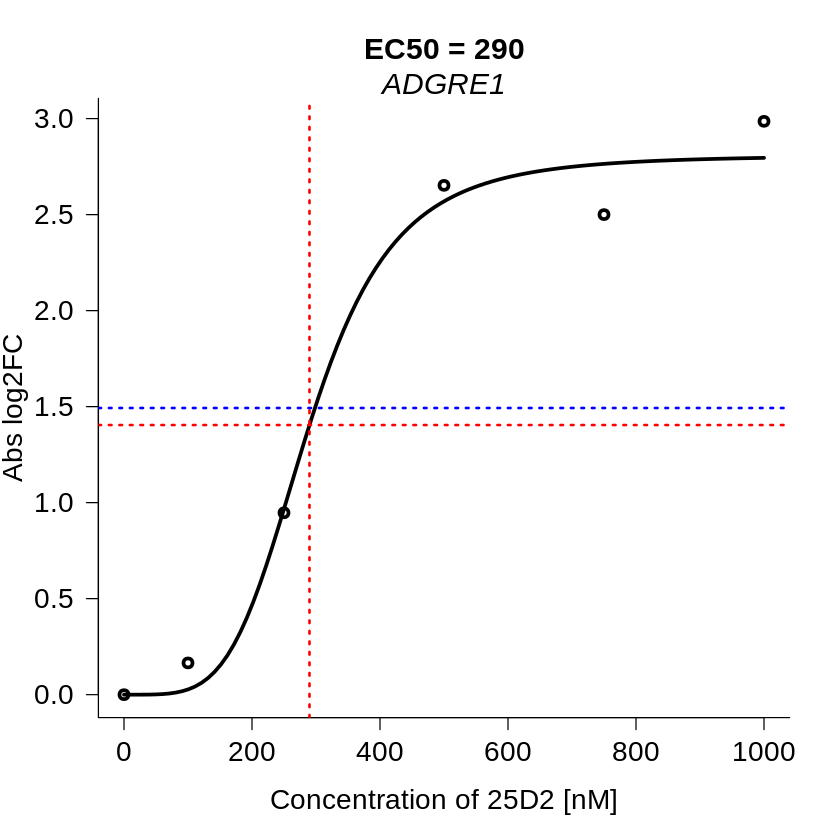

...

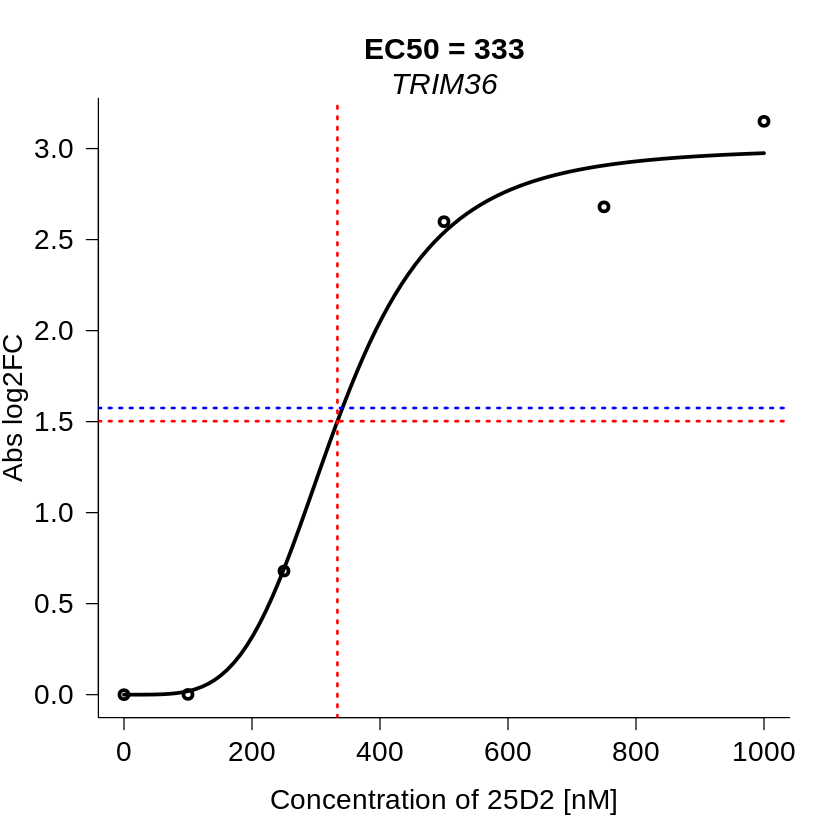

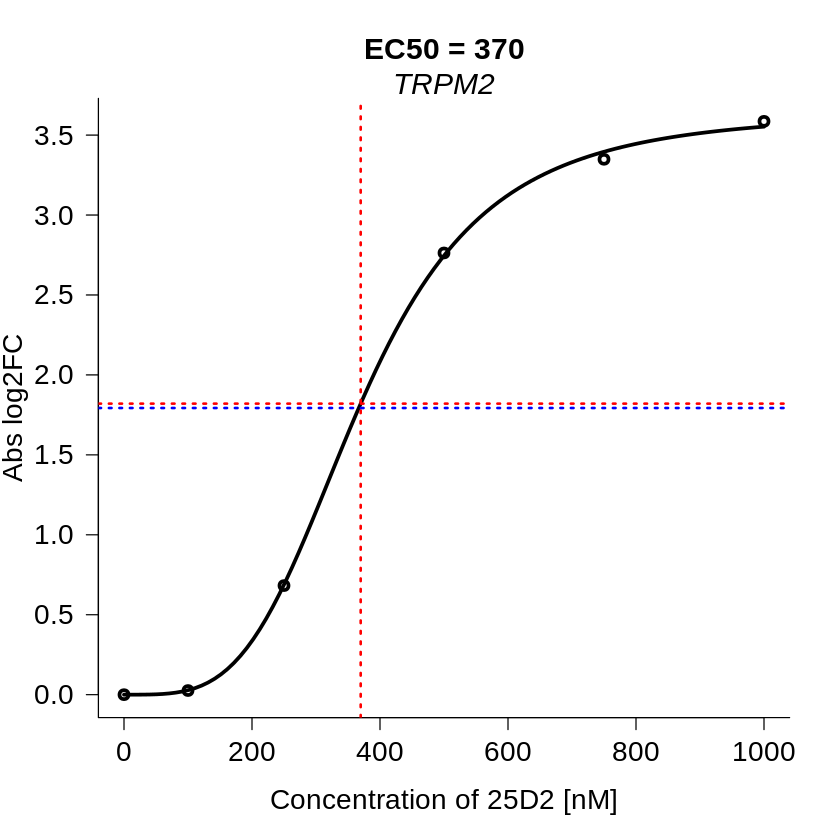

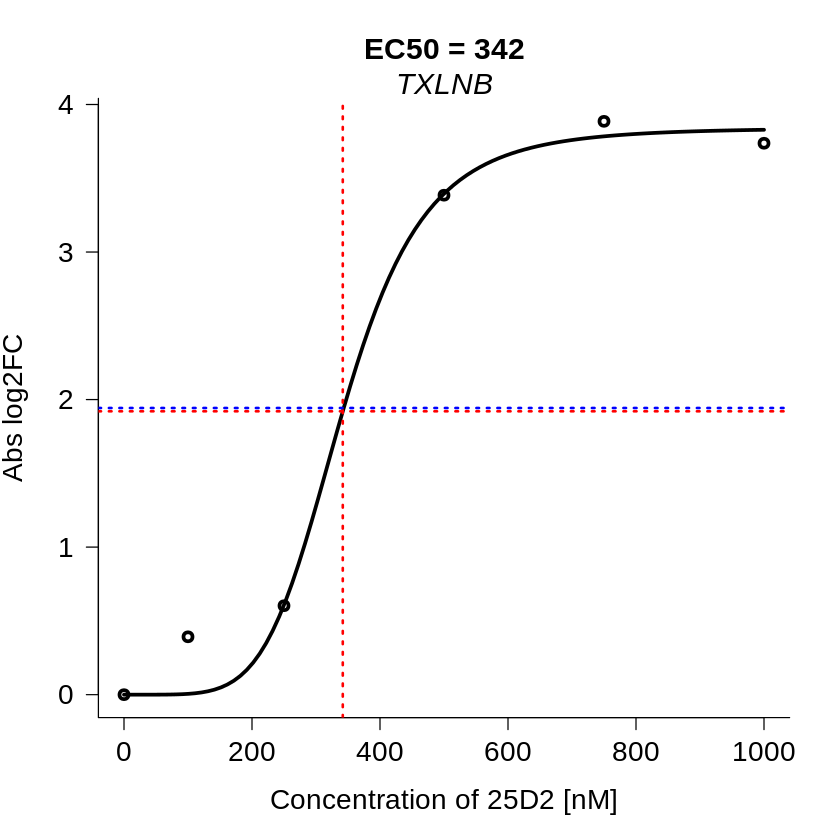

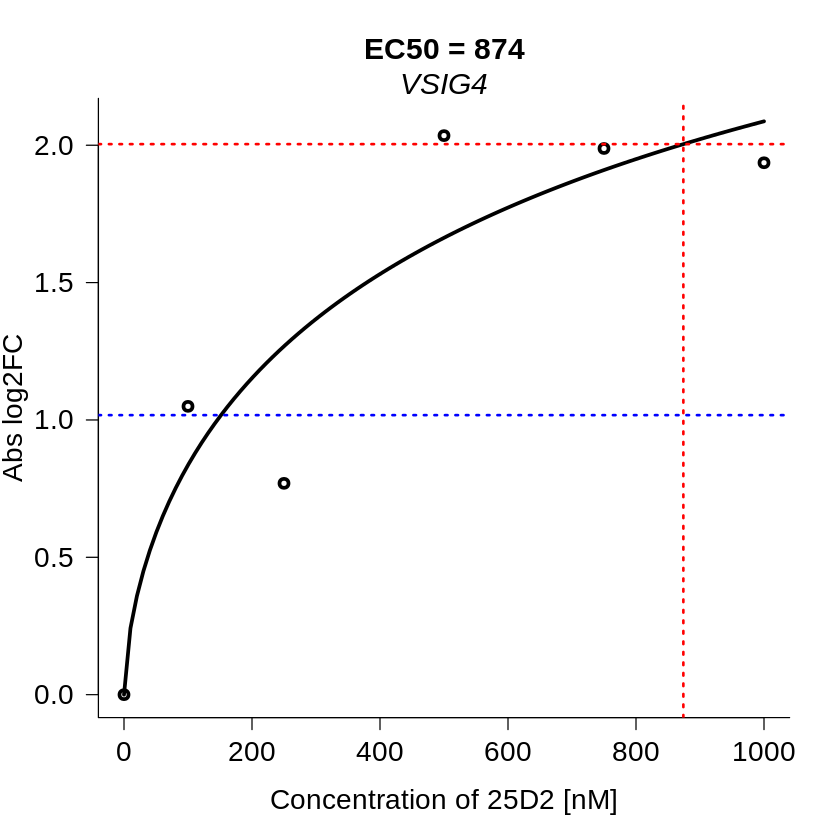

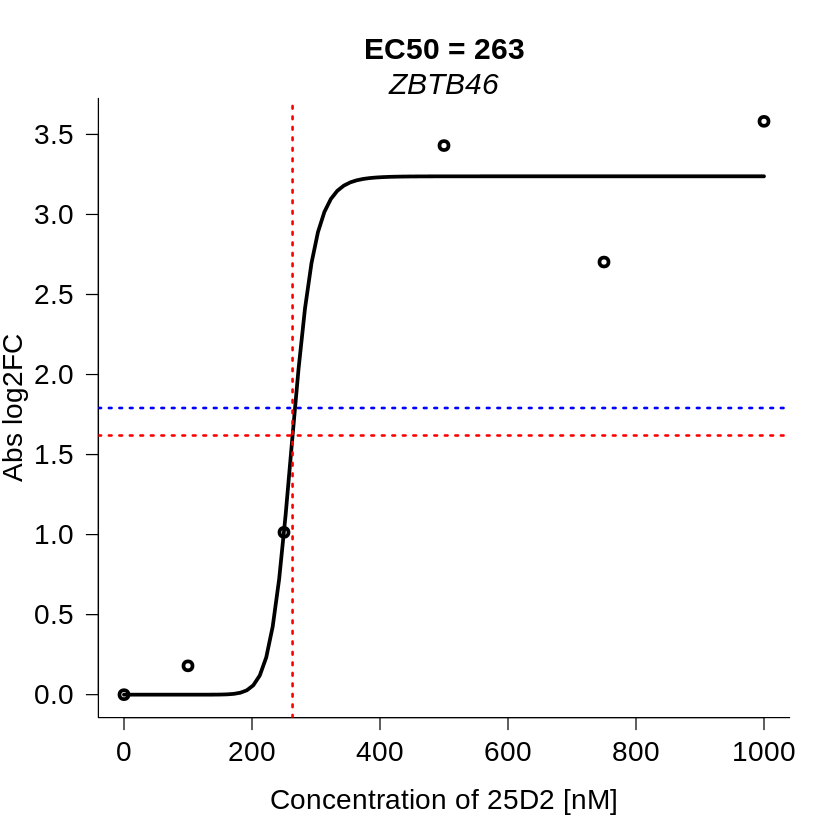

In [34]:
#plot_list = list()
for (i in seq_along(d$fit)){
   
#     pdf(paste("./Curves-cut-25D2/LL3_", d$name[[i]], "-25D2-cut.pdf", sep = ""), 
 #        width = 5, height = 4.34)

      plot(d$fit[[i]],
       bty="l",  
       broken=TRUE, 
       lwd=3,
           log = "",
     # sub = d$name[[i]] #,
       main = paste0("EC50 = ", round(d$fit[[i]]$coefficients['ec_50:(Intercept)'],0)),
       cex.main = 1.5,
      xlab = "Concentration of 25D2 [nM]",
      ylab = "Abs log2FC",
 #     ylim = c(0, 3),
      cex.lab = 1.4,    # X-axis and Y-axis labels size
     cex.axis = 1.4 # Axis labels size
      )
#     mtext ("Top text", adj = 1.7, paste0 ("", d$name[[i]]), cex = 1.3, font = 3)
      mtext(side = 3, paste0 ("", d$name[[i]]), cex = 1.5, font = 3)
      abline(v = d$fit[[i]]$coefficients['ec_50:(Intercept)'], col="red", lwd=2.1, lty=3)
      abline(h = 0.5*(d$fit[[i]]$coefficients['max_value:(Intercept)']), col="red", lwd=2.1, lty=3)
      abline(h = 0.5*(d$real_maxval[[i]]), col="blue", lwd=2.1, lty=3)   
#dev.off()    
    }

In [35]:
models <- map(split(mrg2,
                    mrg2$name),
                    gene_model_LL.3)

result <- map_df(models,
                 tidy,
                 .id = "name")

head (result)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,hill,(Intercept),-5.647891,3.9578122,-1.427023,0.248849978
ABCC3,max_value,(Intercept),1.611781,0.2153698,7.483784,0.004941662
ABCC3,ec_50,(Intercept),365.060650,73.1025884,4.993813,0.015444765
ACTB,hill,(Intercept),-3.007415,1.0342551,-2.907807,0.062107056
ACTB,max_value,(Intercept),1.590136,0.1254452,12.675940,0.001058972
ACTB,ec_50,(Intercept),307.853567,29.4336080,10.459253,0.001865772


In [36]:
res_ec50 = result %>%
filter (., term == "ec_50")

head (res_ec50)

res_pred_maxval = result %>%
filter (., term == "max_value")

#head (res_pred_maxval)

res_ec50 = res_ec50 %>% #eighthours
  mutate (treatment = rep("V25D2",nrow(.)))

head(res_ec50)

name,term,curve,estimate,std.error,statistic,p.value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),365.0607,73.10259,4.993813,0.015444765
ACTB,ec_50,(Intercept),307.8536,29.43361,10.459253,0.001865772
ACVRL1,ec_50,(Intercept),187.9206,137.58315,1.365869,0.265364748
ADAMTSL4,ec_50,(Intercept),372.9621,32.47612,11.484194,0.001417229
ADGRE1,ec_50,(Intercept),289.8093,31.00563,9.346988,0.002593245
ADGRE3,ec_50,(Intercept),290.3102,25.94783,11.188224,0.001530510


name,term,curve,estimate,std.error,statistic,p.value,treatment
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ABCC3,ec_50,(Intercept),365.0607,73.10259,4.993813,0.015444765,V25D2
ACTB,ec_50,(Intercept),307.8536,29.43361,10.459253,0.001865772,V25D2
ACVRL1,ec_50,(Intercept),187.9206,137.58315,1.365869,0.265364748,V25D2
ADAMTSL4,ec_50,(Intercept),372.9621,32.47612,11.484194,0.001417229,V25D2
ADGRE1,ec_50,(Intercept),289.8093,31.00563,9.346988,0.002593245,V25D2
ADGRE3,ec_50,(Intercept),290.3102,25.94783,11.188224,0.001530510,V25D2


In [37]:
library (metafor)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack



Loading the 'metafor' package (version 3.0-2). For an
introduction to the package please type: help(metafor)




In [38]:
pooled_ED50 <- rma(estimate, std.error^2, data = res_ec50)
pooled_ED50


Random-Effects Model (k = 206; tau^2 estimator: REML)

tau^2 (estimated amount of total heterogeneity): 3735.1937 (SE = 542.9857)
tau (square root of estimated tau^2 value):      61.1162
I^2 (total heterogeneity / total variability):   85.04%
H^2 (total variability / sampling variability):  6.68

Test for Heterogeneity:
Q(df = 205) = 1428.5512, p-val < .0001

Model Results:

estimate      se     zval    pval     ci.lb     ci.ub 
295.6639  5.4063  54.6887  <.0001  285.0677  306.2601  *** 

---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


In [39]:
res_model = full_join (res_ec50, res_pred_maxval, by = c("name" = "name"), suffix=c(".ec_50","pred_maxval")) 

head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),365.0607,73.10259,4.993813,0.015444765,V25D2,max_value,(Intercept),1.611781,0.2153698,7.483784,0.0049416618
ACTB,ec_50,(Intercept),307.8536,29.43361,10.459253,0.001865772,V25D2,max_value,(Intercept),1.590136,0.1254452,12.675940,0.0010589721
ACVRL1,ec_50,(Intercept),187.9206,137.58315,1.365869,0.265364748,V25D2,max_value,(Intercept),2.320446,0.7936679,2.923699,0.0613122839
ADAMTSL4,ec_50,(Intercept),372.9621,32.47612,11.484194,0.001417229,V25D2,max_value,(Intercept),2.905819,0.2021386,14.375381,0.0007296226
ADGRE1,ec_50,(Intercept),289.8093,31.00563,9.346988,0.002593245,V25D2,max_value,(Intercept),2.808211,0.2118400,13.256282,0.0009276397
ADGRE3,ec_50,(Intercept),290.3102,25.94783,11.188224,0.001530510,V25D2,max_value,(Intercept),3.444645,0.2006591,17.166653,0.0004306593


In [40]:
head (d$fit, n=2)

[[1]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -5.648                  1.612                365.061  


[[2]]

A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -3.007                  1.590                307.854  



In [41]:
d$fit[[1]]


A 'drc' model.

Call:
drm(formula = value ~ conc, data = df, fct = LL.3(names = c("hill",     "max_value", "ec_50")))

Coefficients:
     hill:(Intercept)  max_value:(Intercept)      ec_50:(Intercept)  
               -5.648                  1.612                365.061  


In [42]:
real_FC = as.vector (d$real_maxval)
#real_halfFC = as.vector (0.5*(d$real_maxval)) 

In [43]:
head (res_model)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),365.0607,73.10259,4.993813,0.015444765,V25D2,max_value,(Intercept),1.611781,0.2153698,7.483784,0.0049416618
ACTB,ec_50,(Intercept),307.8536,29.43361,10.459253,0.001865772,V25D2,max_value,(Intercept),1.590136,0.1254452,12.675940,0.0010589721
ACVRL1,ec_50,(Intercept),187.9206,137.58315,1.365869,0.265364748,V25D2,max_value,(Intercept),2.320446,0.7936679,2.923699,0.0613122839
ADAMTSL4,ec_50,(Intercept),372.9621,32.47612,11.484194,0.001417229,V25D2,max_value,(Intercept),2.905819,0.2021386,14.375381,0.0007296226
ADGRE1,ec_50,(Intercept),289.8093,31.00563,9.346988,0.002593245,V25D2,max_value,(Intercept),2.808211,0.2118400,13.256282,0.0009276397
ADGRE3,ec_50,(Intercept),290.3102,25.94783,11.188224,0.001530510,V25D2,max_value,(Intercept),3.444645,0.2006591,17.166653,0.0004306593


In [44]:
res_model2 = res_model %>%
add_column (real_FC) %>%
mutate (., pred_halfFC = 0.5*estimatepred_maxval) %>%
mutate (., real_halfFC = 0.5*real_FC) %>%
mutate (., ratio_predvsreal = (pred_halfFC/real_halfFC)) %>%
mutate (., perc_dev = abs(ratio_predvsreal-1)*100)

head (res_model2)

name,term.ec_50,curve.ec_50,estimate.ec_50,std.error.ec_50,statistic.ec_50,p.value.ec_50,treatment,termpred_maxval,curvepred_maxval,estimatepred_maxval,std.errorpred_maxval,statisticpred_maxval,p.valuepred_maxval,real_FC,pred_halfFC,real_halfFC,ratio_predvsreal,perc_dev
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ABCC3,ec_50,(Intercept),365.0607,73.10259,4.993813,0.015444765,V25D2,max_value,(Intercept),1.611781,0.2153698,7.483784,0.0049416618,1.834794,0.8058904,0.9173970,0.8784533,12.154671
ACTB,ec_50,(Intercept),307.8536,29.43361,10.459253,0.001865772,V25D2,max_value,(Intercept),1.590136,0.1254452,12.675940,0.0010589721,1.541519,0.7950680,0.7707593,1.0315386,3.153862
ACVRL1,ec_50,(Intercept),187.9206,137.58315,1.365869,0.265364748,V25D2,max_value,(Intercept),2.320446,0.7936679,2.923699,0.0613122839,2.213510,1.1602229,1.1067552,1.0483103,4.831034
ADAMTSL4,ec_50,(Intercept),372.9621,32.47612,11.484194,0.001417229,V25D2,max_value,(Intercept),2.905819,0.2021386,14.375381,0.0007296226,2.613400,1.4529094,1.3067002,1.1118919,11.189194
ADGRE1,ec_50,(Intercept),289.8093,31.00563,9.346988,0.002593245,V25D2,max_value,(Intercept),2.808211,0.2118400,13.256282,0.0009276397,2.985780,1.4041055,1.4928901,0.9405284,5.947164
ADGRE3,ec_50,(Intercept),290.3102,25.94783,11.188224,0.001530510,V25D2,max_value,(Intercept),3.444645,0.2006591,17.166653,0.0004306593,3.282920,1.7223224,1.6414601,1.0492624,4.926241


In [45]:
write.xlsx (res_model2, "./data/ec50table_25D2_LL3.xlsx")

In [46]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Rocky Linux 8.5 (Green Obsidian)

Matrix products: default
BLAS/LAPACK: /research/users/andreha/miniconda3/envs/Mamba-14/lib/libopenblasp-r0.3.18.so

locale:
 [1] LC_CTYPE=C.UTF-8           LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] metafor_3.0-2   Matrix_1.4-0    modelr_0.1.8    broom_0.7.11   
 [5] drc_3.0-1       MASS_7.3-54     ggpubr_0.4.0    reshape2_1.4.4 
 [9] cowplot_1.1.1   ggrepel_0.9.1   magrittr_2.0.1  openxlsx_4.2.5 
[13] forcats_0.5.1   stringr_1.4.0   dplyr_1.0.7     purrr_0.3.4    
[